# Clown. Part 1

## Установка 🪓

#### 01
Проверяем GPU и скачиваем зависимости:

In [1]:
!nvidia-smi

Tue Apr  1 15:47:44 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P0             28W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install bitsandbytes transformers accelerate peft -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 MB 21.7 MB/s eta 0:00:00:00:0100:01


In [3]:
!pip install git+https://github.com/huggingface/diffusers.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


#### 02
Загружаем обучающий скрипт DreamBooth для диффузоров SDXL:

In [4]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py

--2025-04-01 15:48:10--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 84961 (83K) [text/plain]
Saving to: ‘train_dreambooth_lora_sdxl.py’

train_dreambooth_lo 100%[===================>]  82.97K  --.-KB/s    in 0.004s  

2025-04-01 15:48:11 (18.4 MB/s) - ‘train_dreambooth_lora_sdxl.py’ saved [84961/84961]



## Датасет 🐶

#### 01
Создаем датасет и загружаем фото:

In [5]:
!mkdir -p buff
!cp /kaggle/input/bernard-buffet-arts/* buff/

In [6]:
from PIL import Image

def image_grid(imgs, rows, cols, resize=256):

    if resize is not None:
        imgs = [img.resize((resize, resize)) for img in imgs]
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

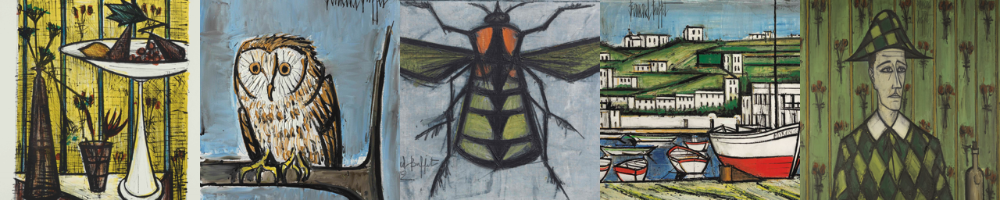

In [8]:
import glob

img_paths = "./buff/*.png"
imgs = [Image.open(path) for path in glob.glob(img_paths)]

num_imgs_to_preview = 5
image_grid(imgs[:num_imgs_to_preview], 1, num_imgs_to_preview)

#### 02
Создаем собственные подписи к изображениям с помощью BLIP:

In [9]:
import requests
from transformers import AutoProcessor, BlipForConditionalGeneration
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

# Загрузка процессора и модели субтитров
blip_processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base",torch_dtype=torch.float16).to(device)

# Утилита для субтитров
def caption_images(input_image):
    inputs = blip_processor(images=input_image, return_tensors="pt").to(device, torch.float16)
    pixel_values = inputs.pixel_values

    generated_ids = blip_model.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_caption

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [10]:
import glob
from PIL import Image

# Создаем список пар (Pil.Image, path)
local_dir = "./buff/"
imgs_and_paths = [(path,Image.open(path)) for path in glob.glob(f"{local_dir}*.png")]

In [12]:
import json

caption_prefix = "photo collage in BUFFET style, "
with open(f'{local_dir}metadata.jsonl', 'w') as outfile:
  for img in imgs_and_paths:
      caption = caption_prefix + caption_images(img[1]).split("\n")[0]
      entry = {"file_name":img[0].split("/")[-1], "prompt": caption}
      json.dump(entry, outfile)
      outfile.write('\n')

In [13]:
!cat buff/metadata.jsonl

{"file_name": "098.png", "prompt": "photo collage in BUFFET style, a painting of a vase and flowers on a table"}
{"file_name": "061.png", "prompt": "photo collage in BUFFET style, an owl sitting on a branch with a blue background"}
{"file_name": "043.png", "prompt": "photo collage in BUFFET style, a painting of a green and black insect"}
{"file_name": "025.png", "prompt": "photo collage in BUFFET style, a painting of boats in a harbor"}
{"file_name": "110.png", "prompt": "photo collage in BUFFET style, a painting of a man in a green shirt"}
{"file_name": "063.png", "prompt": "photo collage in BUFFET style, a painting of a bowl of food and a pitcher"}
{"file_name": "034.png", "prompt": "photo collage in BUFFET style, a painting of a table with a basket and bottles"}
{"file_name": "107.png", "prompt": "photo collage in BUFFET style, a painting of a city with a tower in the background"}
{"file_name": "184.png", "prompt": "photo collage in BUFFET style, a painting of a man with a hat and a

In [14]:
import gc

del blip_processor, blip_model
gc.collect()
torch.cuda.empty_cache()

## Подготовка к обучению 💻

#### 01
Инициализируем `accelerate`:

In [16]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!accelerate config default

accelerate configuration saved at /root/.cache/huggingface/accelerate/default_config.yaml


#### 02
Входим в учетную запись Hugging Face:

In [17]:
from huggingface_hub import notebook_login
notebook_login()

## Обучение модели! 🔬

#### 01
Задаем все значения и обучаем модель `buffet_style_LoRA`:

In [18]:
!pip install datasets -q

In [19]:
#!/usr/bin/env bash
!accelerate launch train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --dataset_name="buff" \
  --output_dir="buffet_style_LoRA" \
  --caption_column="prompt"\
  --mixed_precision="fp16" \
  --instance_prompt="photo collage in BUFFET style" \
  --resolution=1024 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=3 \
  --gradient_checkpointing \
  --learning_rate=1e-4 \
  --snr_gamma=5.0 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --mixed_precision="fp16" \
  --use_8bit_adam \
  --max_train_steps=1000 \
  --checkpointing_steps=500 \
  --seed="0"

2025-04-01 15:55:28.999510: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-01 15:55:29.018910: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-01 15:55:29.025112: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
tokenizer_config.json: 100%|███████████████████| 737/737 [00:00<00:00, 3.66MB/s]
vocab.json: 100%|██████████████████████████| 1.06M/1.06M [00:00<00:00, 4.21MB/s]
merges.txt: 100%|████████████████████████████| 525k/525k [00:00<00:00, 57.7MB/s]
config.json: 100%|█████████████████████████████| 565/565 [00:00<00:00, 3.27MB/s]
You are using a model of type clip_text_m

In [20]:
!ls buffet_style_LoRA

checkpoint-1000  checkpoint-500  logs  pytorch_lora_weights.safetensors


#### 02
Сохраняем модель в hub и проверяем ее:

In [21]:
from huggingface_hub import whoami
from pathlib import Path

output_dir = "buffet_style_LoRA"
username = whoami(token=Path("/root/.cache/huggingface/"))["name"]
repo_id = f"{username}/{output_dir}"

In [22]:
from train_dreambooth_lora_sdxl import save_model_card
from huggingface_hub import upload_folder, create_repo

repo_id = create_repo(repo_id, exist_ok=True).repo_id

save_model_card(
    repo_id = repo_id,
    images=[],
    base_model="stabilityai/stable-diffusion-xl-base-1.0",
    train_text_encoder=False,
    instance_prompt="photo collage in BUFFET style",
    validation_prompt=None,
    repo_folder=output_dir,
    use_dora = False,
    vae_path="madebyollin/sdxl-vae-fp16-fix",
)

upload_folder(
    repo_id=repo_id,
    folder_path=output_dir,
    commit_message="End of training",
    ignore_patterns=["step_*", "epoch_*"],
)

README.md:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

Upload 7 LFS files:   0%|          | 0/7 [00:00<?, ?it/s]

optimizer.bin:   0%|          | 0.00/15.1M [00:00<?, ?B/s]

optimizer.bin:   0%|          | 0.00/15.1M [00:00<?, ?B/s]

events.out.tfevents.1743523053.c2ceac9472f1.149.1:   0%|          | 0.00/3.31k [00:00<?, ?B/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

events.out.tfevents.1743523053.c2ceac9472f1.149.0:   0%|          | 0.00/250k [00:00<?, ?B/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/imnlv/buffet_style_LoRA/commit/78c5937c379f8cb16e6b8b1632f03191859f5c32', commit_message='End of training', commit_description='', oid='78c5937c379f8cb16e6b8b1632f03191859f5c32', pr_url=None, repo_url=RepoUrl('https://huggingface.co/imnlv/buffet_style_LoRA', endpoint='https://huggingface.co', repo_type='model', repo_id='imnlv/buffet_style_LoRA'), pr_revision=None, pr_num=None)

In [23]:
from IPython.display import display, Markdown

link_to_model = f"https://huggingface.co/{repo_id}"
display(Markdown("### Your model has finished training.\nAccess it here: {}".format(link_to_model)))

### Your model has finished training.
Access it here: https://huggingface.co/imnlv/buffet_style_LoRA

## Генерация 🤡

#### 01
Загружаем библиотеку с huggingface - `buffet_style_LoRA`:

In [1]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL

vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.bfloat16,
    variant="fp16",
    use_safetensors=True
)
pipe.load_lora_weights(repo_id)
_ = pipe.to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

In [2]:
from diffusers import DiffusionPipeline, AutoencoderKL
import torch

# Загружаем VAE
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)

# Загружаем базовую модель Stable Diffusion XL
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)

# Загружаем LoRA-веса напрямую с Hugging Face
pipe.load_lora_weights("imnlv/buffet_style_LoRA", revision="main")

# Применяем LoRA
pipe.fuse_lora(lora_scale=1.0)

# Перемещаем модель на GPU
pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

#### 02
Генерируем изображения: Clown. Part 01 - `Clown portraits`:

  0%|          | 0/50 [00:00<?, ?it/s]

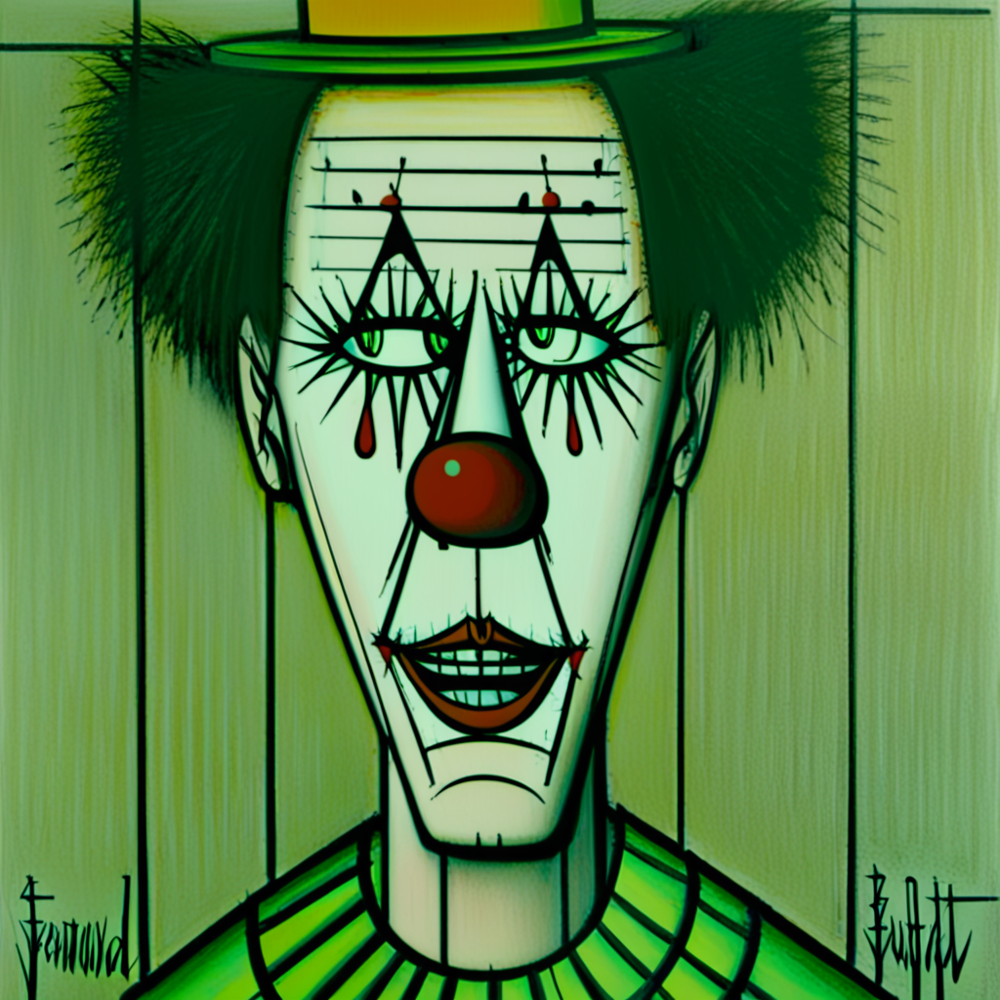

In [8]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who grins, green and yellow"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

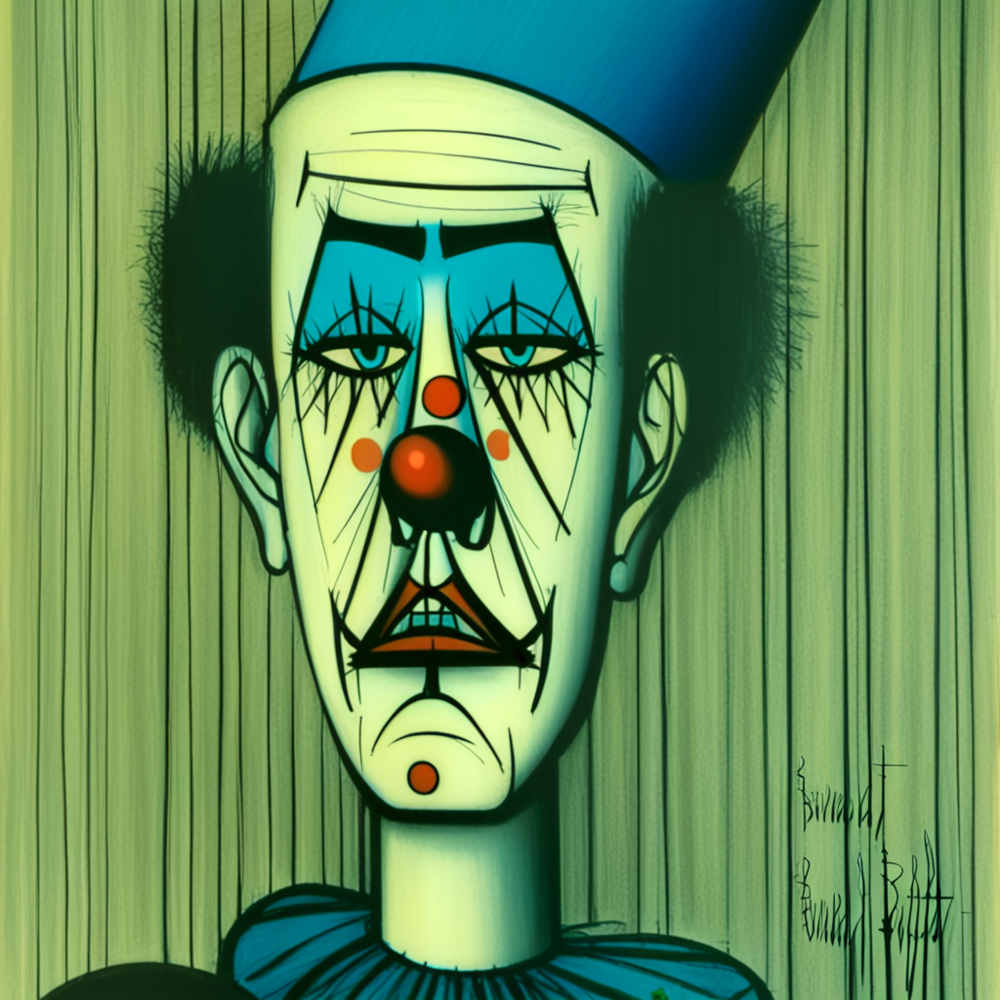

In [21]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who sad, blue and black"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

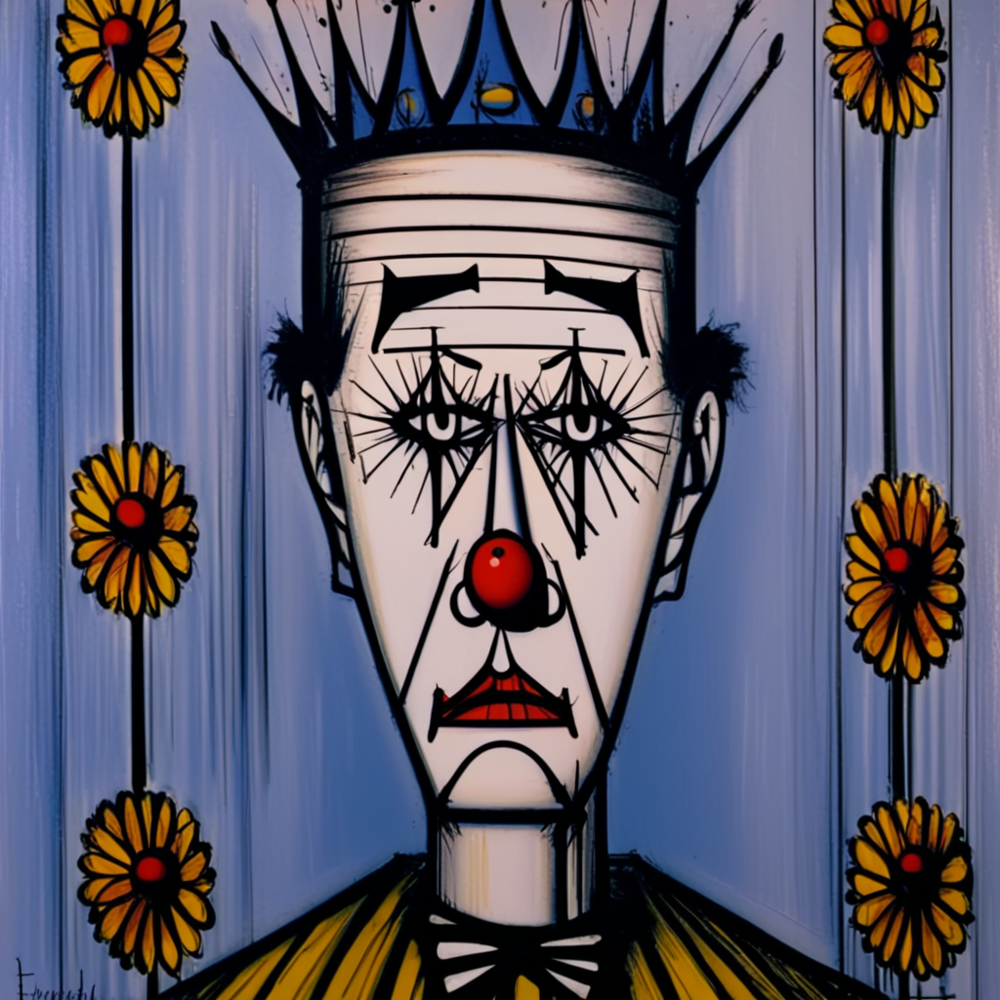

In [24]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who sad and cry, blue and black"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

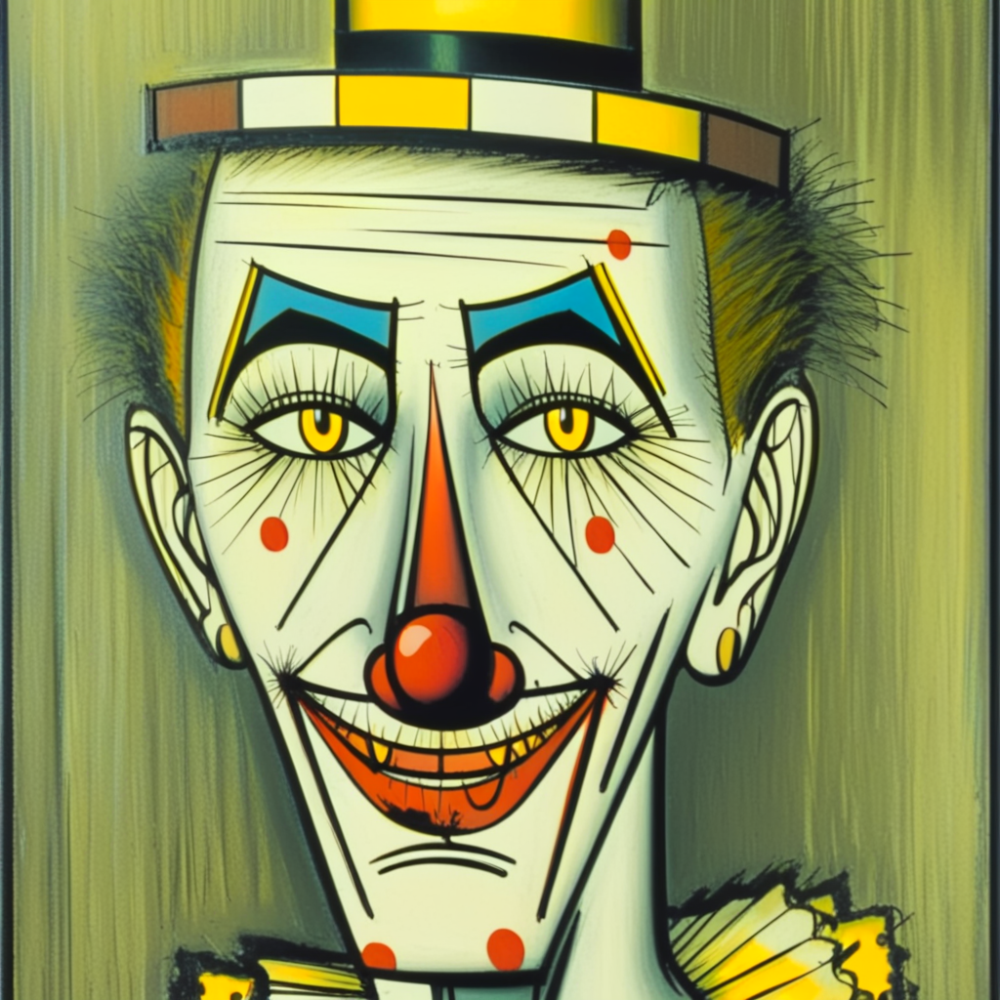

In [13]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who smile, white and yellow"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

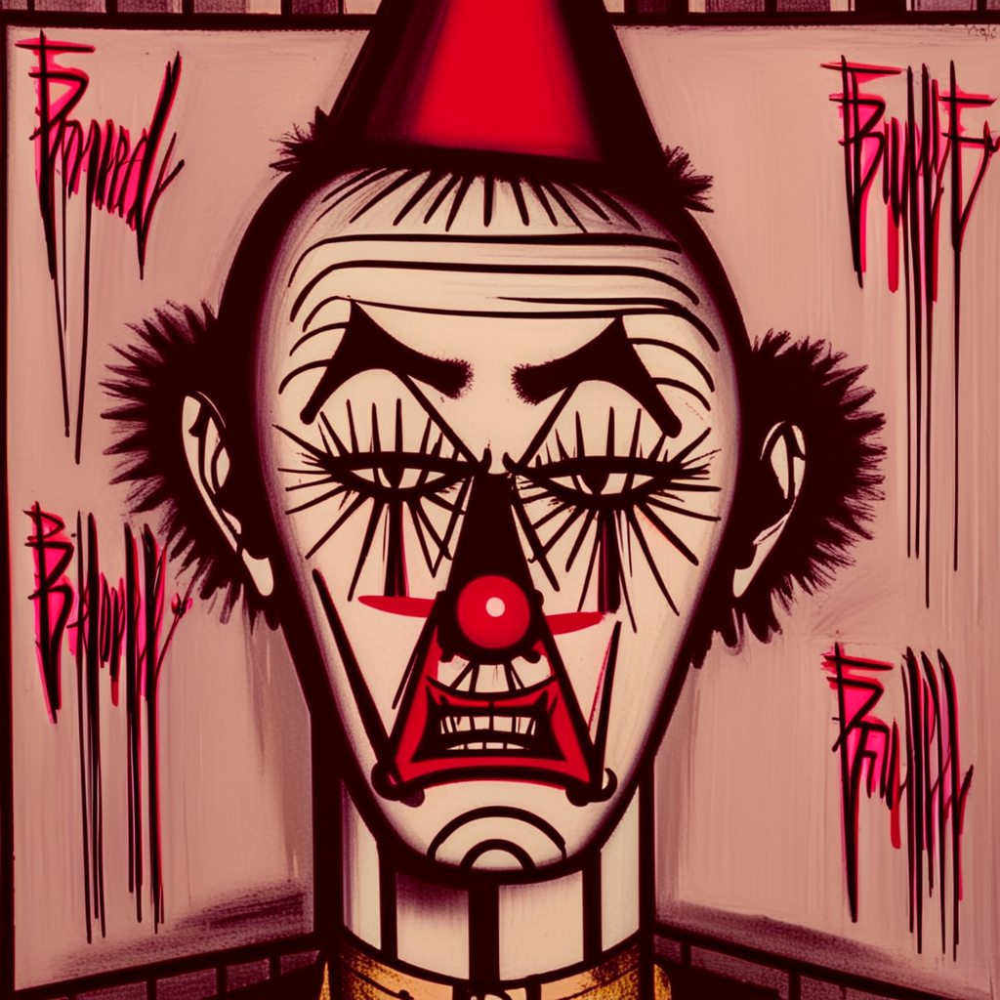

In [14]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who angry and mad, red and black"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

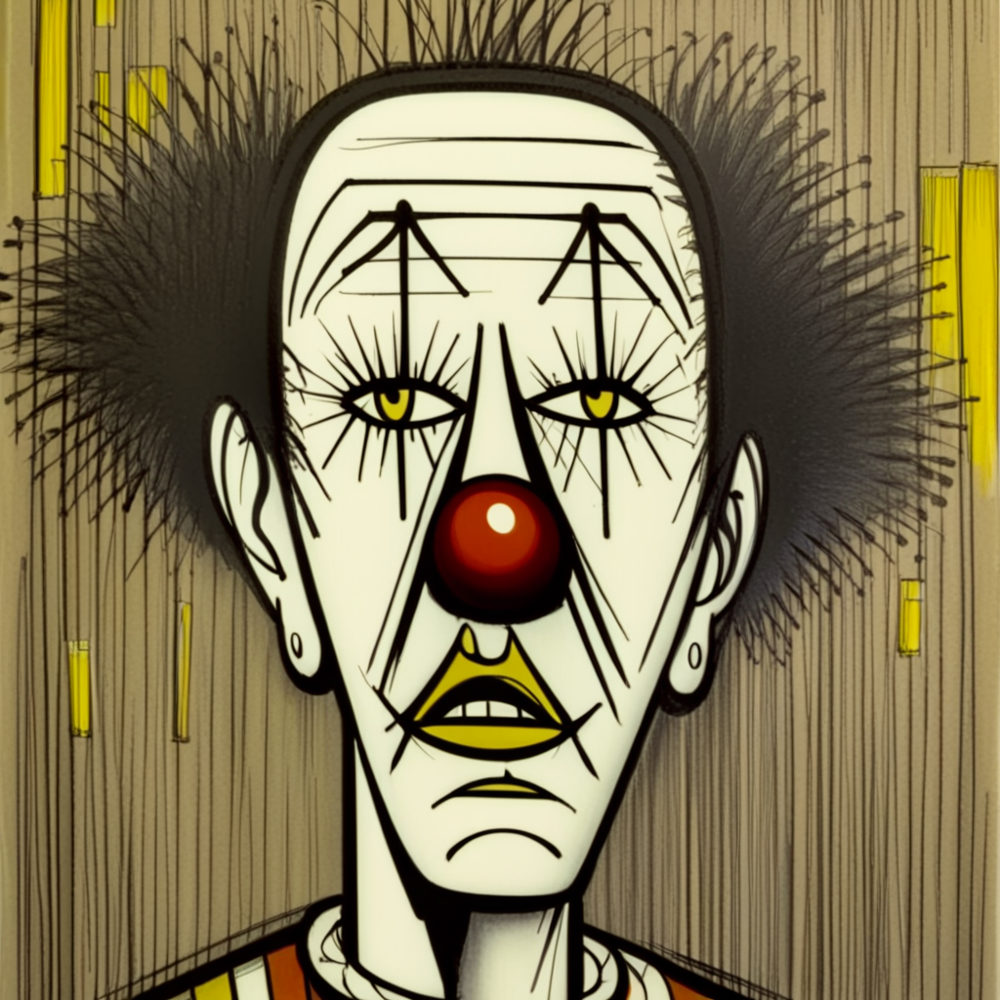

In [32]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who is surprised and shocked, brown and yellow"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

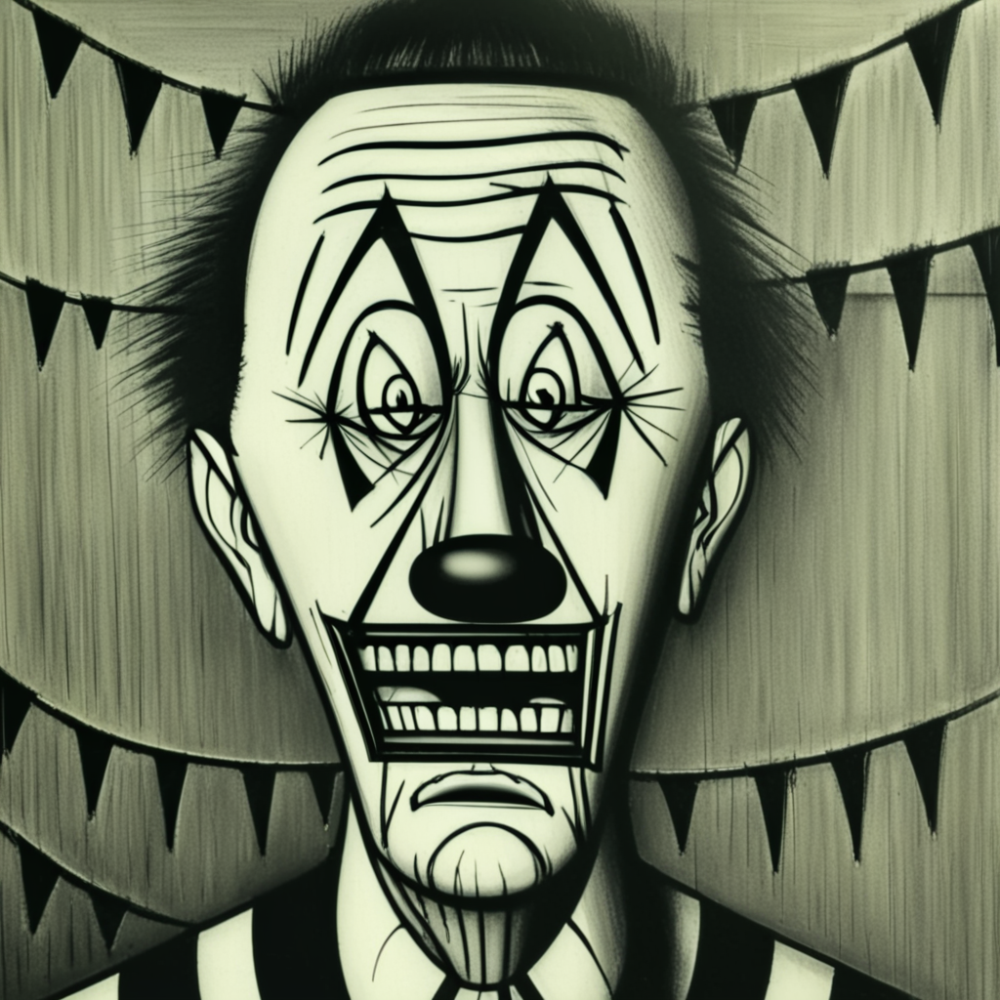

In [54]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who is very afraid, panicking and crying, black and white"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

  0%|          | 0/50 [00:00<?, ?it/s]

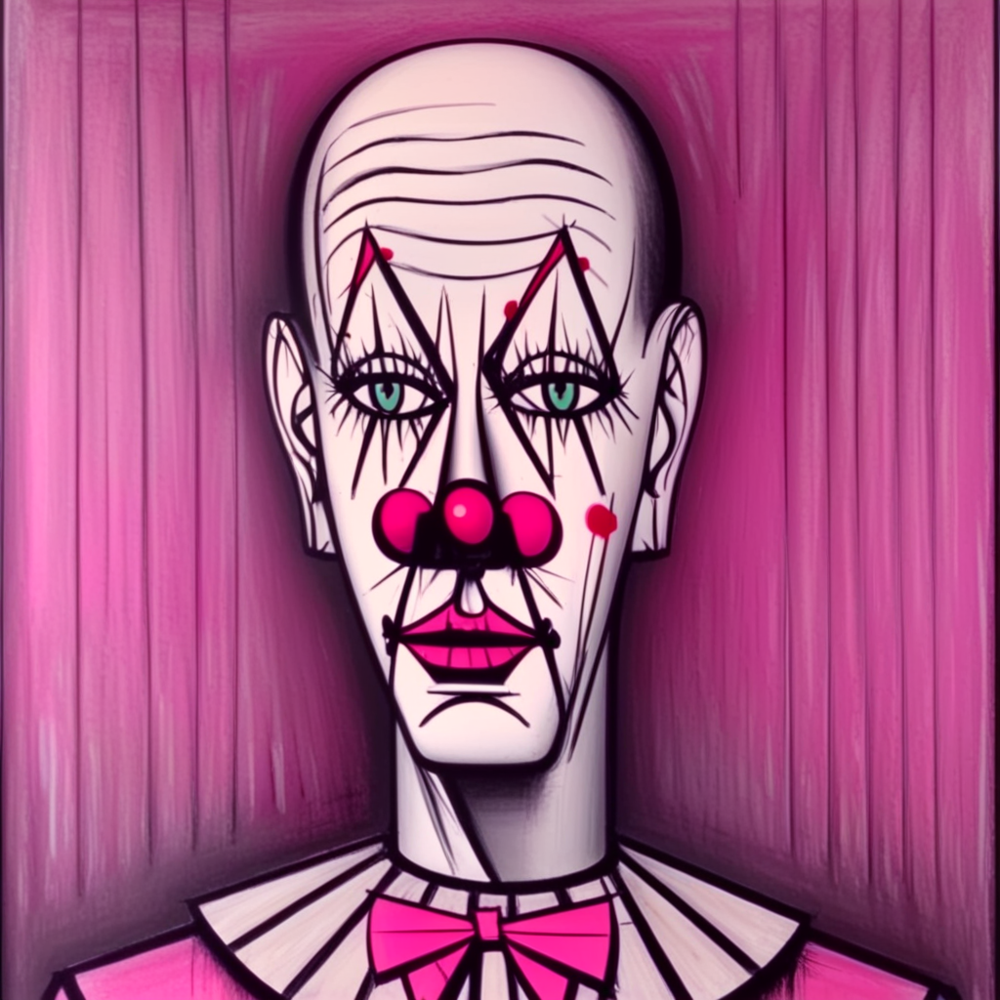

In [4]:
# Генерация изображения
prompt = "photo collage in BUFFET style, portrait of a clown who feels admiration and love, white and pink"
image = pipe(prompt, num_inference_steps=50, guidance_scale=8.0).images[0]

# Результат
image

#### 03
Генерируем изображения: Clown. Part 02 - `Scenes with clowns`:

*Т.к мне не хватило достаточного количества GPU в Kaggle блокноте, вторую серию я реализовала в блокноте GoogleColab, скачав модель с huggingface (файл `Clown_02`)*